In [2]:
# First let's import the packages we will use in this project
# You can do this all now or as you need them
import pandas as pd
import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib
plt.style.use('ggplot')
from matplotlib.pyplot import figure

%matplotlib inline
matplotlib.rcParams['figure.figsize'] = (12,8)

#pd.options.mode.chained_assignment = None
df=pd.read_csv(r"E:/Python project/movies.csv")


In [3]:
df.head()
#This function gives us the top 5 Rows

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime
0,The Shining,R,Drama,1980,"June 13, 1980 (United States)",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000.0,46998772.0,Warner Bros.,146.0
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980 (United States)",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000.0,58853106.0,Columbia Pictures,104.0
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980 (United States)",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000.0,538375067.0,Lucasfilm,124.0
3,Airplane!,PG,Comedy,1980,"July 2, 1980 (United States)",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000.0,83453539.0,Paramount Pictures,88.0
4,Caddyshack,R,Comedy,1980,"July 25, 1980 (United States)",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000.0,39846344.0,Orion Pictures,98.0


In [4]:
#To know datatypes for columns
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget      float64
gross       float64
company      object
runtime     float64
dtype: object

In [5]:
print(df['budget'].isna().sum())

2171


In [6]:
df = df.replace([np.inf, -np.inf], np.nan).dropna(subset=['budget', 'gross']) #Droping Rows with Non-Finite Values If non-finite values are rare and unimportant, you can drop them:
df['budget'] = df['budget'].astype('int64') #the starting-df['budget'] line is giving it a new name
df['gross'] = df['gross'].astype('int64')

In [7]:
print(df['budget'].unique())  # Check for unusual values like NaN, inf, or very large/small floats.


[ 19000000   4500000  18000000   3500000   6000000    550000  27000000
  54000000  10000000  15000000   5000000  20000000   6500000   5100000
   1000000  11000000  44000000  12000000   9000000   4800000   4000000
   3000000  22000000   7000000   5500000    350000   2500000   1250000
  28000000  14000000  32000000  12500000   2800000   8500000  16000000
    400000  26000000  17000000   8600000    800000   8000000   2700000
  13000000  46000000  24000000   2000000  10500000   7500000  13200000
  50000000  10700000  11200000  21000000   2300000    300000  35000000
    425000   9500000  11300000    850000  13400000  25000000  32500000
   6200000  39000000  20500000   9700000  47000000  27500000   5952000
  36000000   3300000   5600000   1200000    457000   4520000  14500000
    250000  14400000    700000  11800000    220000  10100000     50000
   6400000  40000000  30000000   1800000   8200000   1500000   2600000
  58000000     90000   7200000   2550000   1065000   4600000  15100000
   630

In [8]:
#Change datatype of columns
df['budget'] = df['budget'].astype('int64')
df['gross'] = df['gross'].astype('int64')


In [9]:
df.dtypes

name         object
rating       object
genre        object
year          int64
released     object
score       float64
votes       float64
director     object
writer       object
star         object
country      object
budget        int64
gross         int64
company      object
runtime     float64
dtype: object

In [10]:
df['released']=df['released'].astype('str')

In [11]:
# Remove extra text (e.g., '(United States)')
df['released'] = df['released'].str.extract(r'(\w+ \d{1,2}, \d{4})')

# Convert to datetime format
df['YearCorrect'] = pd.to_datetime(df['released'], format='%B %d, %Y')

# Convert to Year-Month-Date format
df['YearCorrect'] = df['YearCorrect'].dt.strftime('%Y-%m-%d')
df

#Print only the first four value
df['YearCorrect']=df['YearCorrect'].astype(str).str[:4]
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7648,Bad Boys for Life,R,Action,2020,"January 17, 2020",6.6,140000.0,Adil El Arbi,Peter Craig,Will Smith,United States,90000000,426505244,Columbia Pictures,124.0,2020
7649,Sonic the Hedgehog,PG,Action,2020,"February 14, 2020",6.5,102000.0,Jeff Fowler,Pat Casey,Ben Schwartz,United States,85000000,319715683,Paramount Pictures,99.0,2020
7650,Dolittle,PG,Adventure,2020,"January 17, 2020",5.6,53000.0,Stephen Gaghan,Stephen Gaghan,Robert Downey Jr.,United States,175000000,245487753,Universal Pictures,101.0,2020
7651,The Call of the Wild,PG,Adventure,2020,"February 21, 2020",6.8,42000.0,Chris Sanders,Michael Green,Harrison Ford,Canada,135000000,111105497,20th Century Studios,100.0,2020


In [12]:
df.dtypes

name            object
rating          object
genre           object
year             int64
released        object
score          float64
votes          float64
director        object
writer          object
star            object
country         object
budget           int64
gross            int64
company         object
runtime        float64
YearCorrect     object
dtype: object

In [13]:
#we are going to order gross by highest to lowest revenue
df.sort_values(by=['gross'],inplace=False ,ascending=False)

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
5445,Avatar,PG-13,Action,2009,"December 18, 2009",7.8,1100000.0,James Cameron,James Cameron,Sam Worthington,United States,237000000,2847246203,Twentieth Century Fox,162.0,2009
7445,Avengers: Endgame,PG-13,Action,2019,"April 26, 2019",8.4,903000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,356000000,2797501328,Marvel Studios,181.0,2019
3045,Titanic,PG-13,Drama,1997,"December 19, 1997",7.8,1100000.0,James Cameron,James Cameron,Leonardo DiCaprio,United States,200000000,2201647264,Twentieth Century Fox,194.0,1997
6663,Star Wars: Episode VII - The Force Awakens,PG-13,Action,2015,"December 18, 2015",7.8,876000.0,J.J. Abrams,Lawrence Kasdan,Daisy Ridley,United States,245000000,2069521700,Lucasfilm,138.0,2015
7244,Avengers: Infinity War,PG-13,Action,2018,"April 27, 2018",8.4,897000.0,Anthony Russo,Christopher Markus,Robert Downey Jr.,United States,321000000,2048359754,Marvel Studios,149.0,2018
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2434,Philadelphia Experiment II,PG-13,Action,1993,"June 4, 1994",4.5,1900.0,Stephen Cornwell,Wallace C. Bennett,Brad Johnson,United States,5000000,2970,Trimark Pictures,97.0,1994
3681,Ginger Snaps,Not Rated,Drama,2000,"May 11, 2001",6.8,43000.0,John Fawcett,Karen Walton,Emily Perkins,Canada,5000000,2554,Copperheart Entertainment,108.0,2001
272,Parasite,R,Horror,1982,"March 12, 1982",3.9,2300.0,Charles Band,Alan J. Adler,Robert Glaudini,United States,800000,2270,Embassy Pictures,85.0,1982
2417,Madadayo,NaN,Drama,1993,"April 17, 1993",7.3,5100.0,Akira Kurosawa,Ishirô Honda,Tatsuo Matsumura,Japan,11900000,596,DENTSU Music And Entertainment,134.0,1993


In [14]:
#This is the setting is used diaply all the rows,Setting it to None removes any limit and displays all the rows
pd.set_option('display.max_rows',None)

In [15]:
#To find oyut a particular value fro32m a particular row
result=df[df['score']==6.4]
result

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
5,Friday the 13th,R,Horror,1980,"May 9, 1980",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
141,S.O.B.,R,Comedy,1981,"July 1, 1981",6.4,5700.0,Blake Edwards,Blake Edwards,Julie Andrews,United States,12000000,14867086,Artista Management,122.0,1981
151,Nighthawks,R,Action,1981,"April 10, 1981",6.4,18000.0,Bruce Malmuth,David Shaber,Sylvester Stallone,United States,5000000,19905359,Universal Pictures,99.0,1981
277,The Final Option,R,Action,1982,"September 16, 1983",6.4,3000.0,Ian Sharp,George Markstein,Lewis Collins,Switzerland,6000000,2666873,Richmond Light Horse Productions,125.0,1983
280,The Border,R,Crime,1982,"February 12, 1982",6.4,6100.0,Tony Richardson,Deric Washburn,Jack Nicholson,United States,22000000,6118683,Efer Productions,108.0,1982
287,Barbarosa,PG,Western,1982,"February 19, 1982",6.4,1500.0,Fred Schepisi,William D. Wittliff,Willie Nelson,United States,11000000,1736123,Incorporated Television Company (ITC),90.0,1982
351,Valley Girl,R,Comedy,1983,"April 29, 1983",6.4,14000.0,Martha Coolidge,Andrew Lane,Nicolas Cage,United States,350000,17343596,Atlantic Entertainment Group,99.0,1983
362,Blue Thunder,R,Action,1983,"May 13, 1983",6.4,18000.0,John Badham,Dan O'Bannon,Roy Scheider,United States,22000000,42313354,Columbia Pictures,109.0,1983
390,Brainstorm,PG,Sci-Fi,1983,"September 30, 1983",6.4,11000.0,Douglas Trumbull,Bruce Joel Rubin,Christopher Walken,United States,15000000,10219460,JF Productions,106.0,1983
394,Uncommon Valor,R,Action,1983,"December 16, 1983",6.4,9300.0,Ted Kotcheff,Joe Gayton,Gene Hackman,United States,14500000,30503151,Paramount Pictures,105.0,1983


In [16]:
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


In [17]:
result = df[df['score'] >= 9.0]
result

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
2443,The Shawshank Redemption,R,Drama,1994,"October 14, 1994",9.3,2400000.0,Frank Darabont,Stephen King,Tim Robbins,United States,25000000,28817291,Castle Rock Entertainment,142.0,1994
5243,The Dark Knight,PG-13,Action,2008,"July 18, 2008",9.0,2400000.0,Christopher Nolan,Jonathan Nolan,Christian Bale,United States,185000000,1005973645,Warner Bros.,152.0,2008


In [18]:
#DROP ANY DUPLICATES
df.drop_duplicates()
df

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980
5,Friday the 13th,R,Horror,1980,"May 9, 1980",6.4,123000.0,Sean S. Cunningham,Victor Miller,Betsy Palmer,United States,550000,39754601,Paramount Pictures,95.0,1980
6,The Blues Brothers,R,Action,1980,"June 20, 1980",7.9,188000.0,John Landis,Dan Aykroyd,John Belushi,United States,27000000,115229890,Universal Pictures,133.0,1980
7,Raging Bull,R,Biography,1980,"December 19, 1980",8.2,330000.0,Martin Scorsese,Jake LaMotta,Robert De Niro,United States,18000000,23402427,Chartoff-Winkler Productions,129.0,1980
8,Superman II,PG,Action,1980,"June 19, 1981",6.8,101000.0,Richard Lester,Jerry Siegel,Gene Hackman,United States,54000000,108185706,Dovemead Films,127.0,1981
9,The Long Riders,R,Biography,1980,"May 16, 1980",7.0,10000.0,Walter Hill,Bill Bryden,David Carradine,United States,10000000,15795189,United Artists,100.0,1980


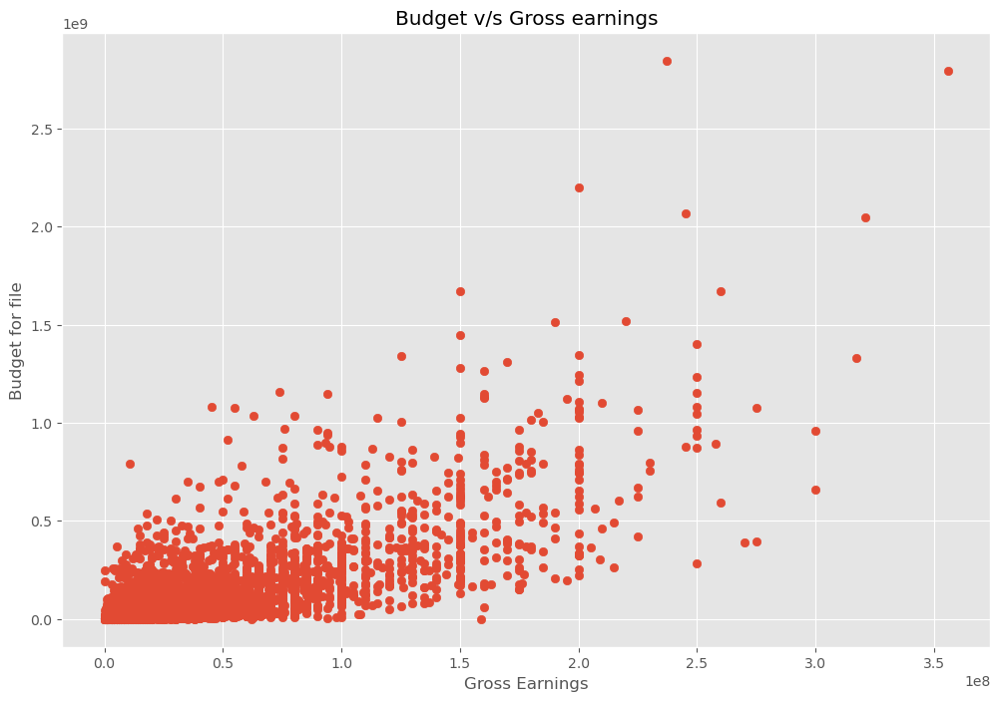

In [19]:
plt.scatter(x=df['budget'],y=df['gross'])
plt.title('Budget v/s Gross earnings')#To add title to the chart
plt.xlabel('Gross Earnings')
plt.ylabel('Budget for file')
plt.show()

In [20]:
df.head()

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,The Shining,R,Drama,1980,"June 13, 1980",8.4,927000.0,Stanley Kubrick,Stephen King,Jack Nicholson,United Kingdom,19000000,46998772,Warner Bros.,146.0,1980
1,The Blue Lagoon,R,Adventure,1980,"July 2, 1980",5.8,65000.0,Randal Kleiser,Henry De Vere Stacpoole,Brooke Shields,United States,4500000,58853106,Columbia Pictures,104.0,1980
2,Star Wars: Episode V - The Empire Strikes Back,PG,Action,1980,"June 20, 1980",8.7,1200000.0,Irvin Kershner,Leigh Brackett,Mark Hamill,United States,18000000,538375067,Lucasfilm,124.0,1980
3,Airplane!,PG,Comedy,1980,"July 2, 1980",7.7,221000.0,Jim Abrahams,Jim Abrahams,Robert Hays,United States,3500000,83453539,Paramount Pictures,88.0,1980
4,Caddyshack,R,Comedy,1980,"July 25, 1980",7.3,108000.0,Harold Ramis,Brian Doyle-Murray,Chevy Chase,United States,6000000,39846344,Orion Pictures,98.0,1980


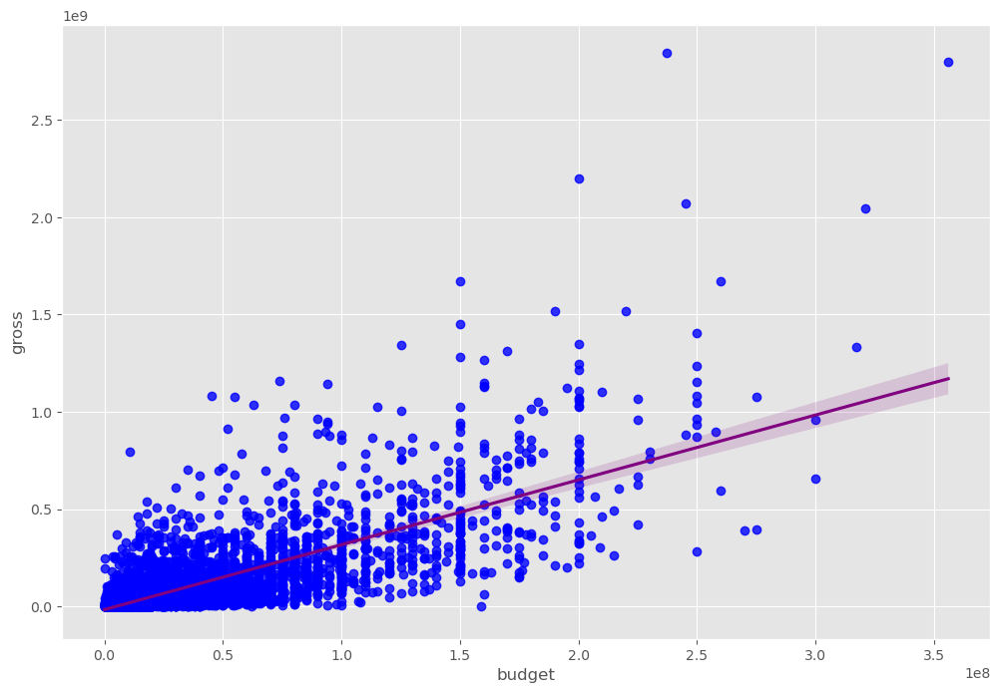

In [21]:
#{lot budget v/s Gross using seaborn
sns.regplot(x='budget',y='gross',data=df,scatter_kws={"color":"blue"},line_kws={"color":"Purple"})
plt.show()

In [22]:
#lets start looking at corelations

numeric_df = df.select_dtypes(include=['number'])
correlation_matrix = numeric_df.corr()
correlation_matrix

             year     score     votes    budget     gross   runtime
year     1.000000  0.055174  0.205758  0.327781  0.274264  0.074203
score    0.055174  1.000000  0.473809  0.071792  0.222143  0.414580
votes    0.205758  0.473809  1.000000  0.440021  0.614904  0.352437
budget   0.327781  0.071792  0.440021  1.000000  0.740395  0.318595
gross    0.274264  0.222143  0.614904  0.740395  1.000000  0.275596
runtime  0.074203  0.414580  0.352437  0.318595  0.275596  1.000000


In [40]:
numeric_df = df.select_dtypes(include=['number'])# to select only the numeric data because only numeric data can be corelated
correlation_matrix = numeric_df.corr()#the correlation matrix will include only numerical columns.
correlation_matrix

               rating     genre      year  released     score     votes  \
rating       1.000000  0.128102  0.022668  0.016372  0.059550  0.009255   
genre        0.128102  1.000000 -0.073026  0.017742  0.034061 -0.136457   
year         0.022668 -0.073026  1.000000  0.001576  0.055174  0.205758   
released     0.016372  0.017742  0.001576  1.000000  0.047069  0.031880   
score        0.059550  0.034061  0.055174  0.047069  1.000000  0.473809   
votes        0.009255 -0.136457  0.205758  0.031880  0.473809  1.000000   
director     0.014847 -0.009303 -0.036936  0.003700  0.005573 -0.010198   
writer      -0.006923  0.017500 -0.024568  0.009328  0.012860 -0.005394   
star         0.003737  0.002619 -0.032770  0.016649  0.009121 -0.017140   
country      0.020148 -0.010847 -0.066662 -0.015514 -0.044690  0.042146   
budget      -0.186892 -0.368900  0.327781  0.023974  0.071792  0.440021   
gross       -0.168814 -0.244380  0.274264  0.011859  0.222143  0.614904   
company     -0.082189 -0.

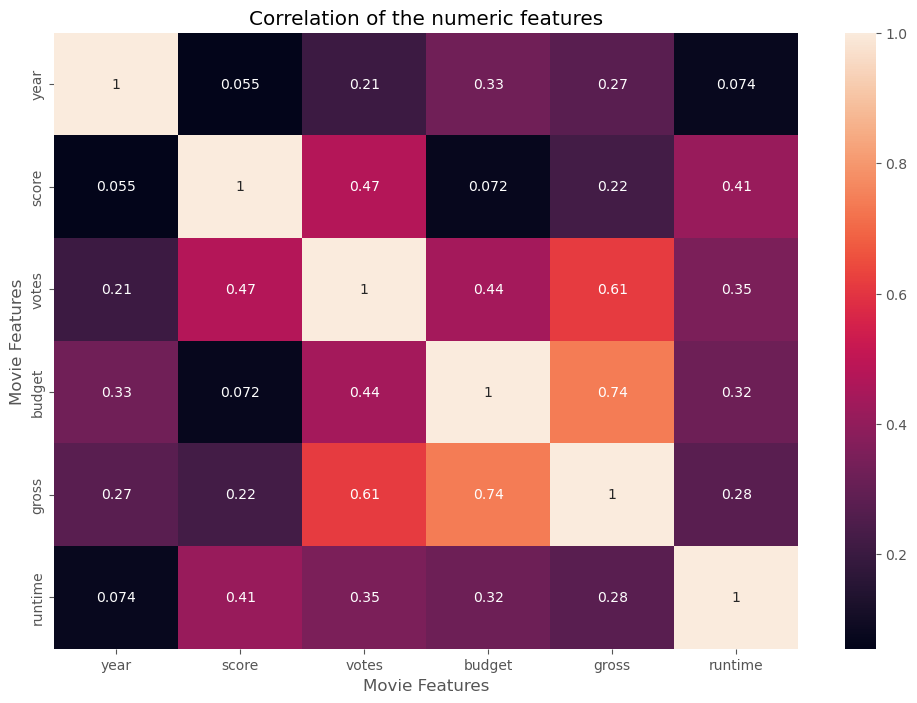

In [24]:
#high corelation between budget and gross
sns.heatmap(correlation_matrix,annot=True)#to print the visulaization of the co relation
plt.title("Correlation of the numeric features")
plt.xlabel("Movie Features")
plt.ylabel("Movie Features")
plt.show()

In [37]:
#Look at company
#change all the object type as numeric type = (object to int)
df_numarized = df
for col_name in df_numarized.columns:
    if(df_numarized[col_name].dtype == 'object'):
        df_numarized[col_name] = df_numarized[col_name].astype('category')
        df_numarized[col_name] = df_numarized[col_name].cat.codes

df_numarized

,name,rating,genre,year,released,score,votes,director,writer,star,country,budget,gross,company,runtime,YearCorrect
0,The Shining,6,6,1980,1235,8.4,927000.0,1800,2841,700,46,19000000,46998772,1432,146.0,0
1,The Blue Lagoon,6,1,1980,1061,5.8,65000.0,1581,1160,215,47,4500000,58853106,454,104.0,0
2,Star Wars: Episode V - The Empire Strikes Back,4,0,1980,1284,8.7,1200000.0,759,1822,1161,47,18000000,538375067,949,124.0,0
3,Airplane!,4,4,1980,1061,7.7,221000.0,891,1416,1478,47,3500000,83453539,1114,88.0,0
4,Caddyshack,6,4,1980,1104,7.3,108000.0,721,352,272,47,6000000,39846344,1089,98.0,0
5,Friday the 13th,6,9,1980,1807,6.4,123000.0,1763,3091,156,47,550000,39754601,1114,95.0,0
6,The Blues Brothers,6,0,1980,1284,7.9,188000.0,976,578,861,47,27000000,115229890,1403,133.0,0
7,Raging Bull,6,3,1980,494,8.2,330000.0,1272,1259,1473,47,18000000,23402427,392,129.0,0
8,Superman II,4,0,1980,1272,6.8,101000.0,1611,1405,596,47,54000000,108185706,550,127.0,1
9,The Long Riders,6,3,1980,1652,7.0,10000.0,2017,281,403,47,10000000,15795189,1397,100.0,0


In [36]:
df.dtypes

name           category
rating             int8
genre              int8
year              int64
released          int16
score           float64
votes           float64
director          int16
writer            int16
star              int16
country            int8
budget            int64
gross             int64
company           int16
runtime         float64
YearCorrect        int8
dtype: object

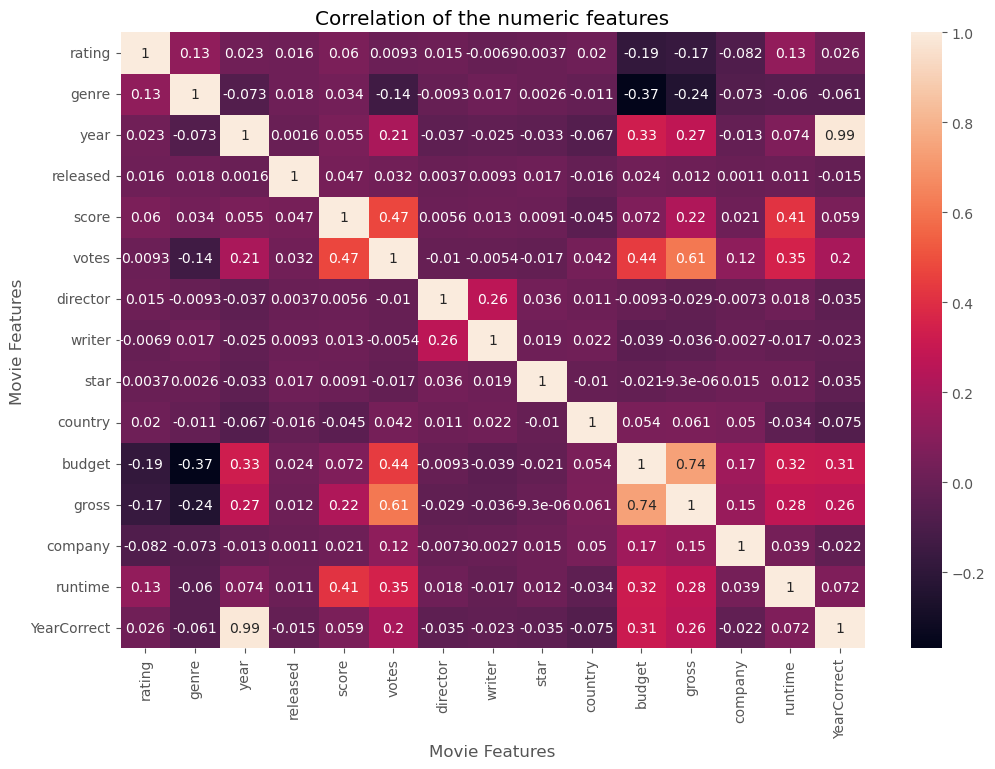

In [47]:
numeric_df = df.select_dtypes(include=['number'])# Select numeric data only
correlation_matrix = numeric_df.corr(method='pearson')  # Compute correlation matrix

# Visualize the heatmap
sns.heatmap(correlation_matrix, annot=True)
plt.title("Correlation of the numeric features")
plt.xlabel("Movie Features")
plt.ylabel("Movie Features")
plt.show()

In [52]:
numeric_df = df.select_dtypes(include=['number'])
correlation_mat = numeric_df.corr()
corr_pairs = correlation_mat.unstack()
corr_pairs

rating       rating         1.000000
             genre          0.128102
             year           0.022668
             released       0.016372
             score          0.059550
             votes          0.009255
             director       0.014847
             writer        -0.006923
             star           0.003737
             country        0.020148
             budget        -0.186892
             gross         -0.168814
             company       -0.082189
             runtime        0.133239
             YearCorrect    0.025553
genre        rating         0.128102
             genre          1.000000
             year          -0.073026
             released       0.017742
             score          0.034061
             votes         -0.136457
             director      -0.009303
             writer         0.017500
             star           0.002619
             country       -0.010847
             budget        -0.368900
             gross         -0.244380
 

In [55]:
sorted_pairs = corr_pairs.sort_values()
sorted_pairs

budget       genre         -0.368900
genre        budget        -0.368900
gross        genre         -0.244380
genre        gross         -0.244380
rating       budget        -0.186892
budget       rating        -0.186892
gross        rating        -0.168814
rating       gross         -0.168814
votes        genre         -0.136457
genre        votes         -0.136457
company      rating        -0.082189
rating       company       -0.082189
YearCorrect  country       -0.074690
country      YearCorrect   -0.074690
genre        company       -0.073293
company      genre         -0.073293
genre        year          -0.073026
year         genre         -0.073026
             country       -0.066662
country      year          -0.066662
YearCorrect  genre         -0.060933
genre        YearCorrect   -0.060933
runtime      genre         -0.060186
genre        runtime       -0.060186
country      score         -0.044690
score        country       -0.044690
budget       writer        -0.039420
w

In [56]:
#To get the high corelated data
high_corr = sorted_pairs[(sorted_pairs) > 0.5]
high_corr

votes        gross          0.614904
gross        votes          0.614904
budget       gross          0.740395
gross        budget         0.740395
year         YearCorrect    0.987716
YearCorrect  year           0.987716
rating       rating         1.000000
writer       writer         1.000000
company      company        1.000000
gross        gross          1.000000
budget       budget         1.000000
country      country        1.000000
star         star           1.000000
director     director       1.000000
votes        votes          1.000000
score        score          1.000000
released     released       1.000000
year         year           1.000000
genre        genre          1.000000
runtime      runtime        1.000000
YearCorrect  YearCorrect    1.000000
dtype: float64

In [ ]:
#Votes and budget have the highest corelation to gross earnings
#company has low corelation